### W207 Final Project
### Spring 2020
### Kaggle Challenge: Facial Keypoints Detection
### Part 3 of 3
### Sang-hyeb Lee, Haerang Lee, Julia Ying

# 1. Load previous data

The following code assumes the notebooks for Part 1 and Part 2 were executed, or the outputs from Part 1 and Part 2 were copied from [Google Drive](https://drive.google.com/drive/folders/1zfT8Hlp32RHILd6cNq0CZ3pTM7m1A7vS?usp=sharing) and saved into the mounted Google Drive. It assume there is a folder "facial_recognition" inside the mounted GoogleDrive, and that inside that folder, there are subfolders: "resources" and "results". It also assumes the best weights from Part 2 were selected based on minimal val_loss and the loaded models were saved in folder "models".


### 1.1 Load saved data from Part 1

In [0]:
# mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


keras version: 2.3.0-tf
X_dev: (281, 96, 96, 1)
Y_dev_knn: (281, 30)


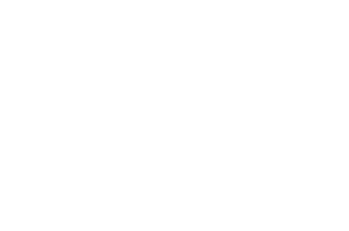

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow import keras
import pickle

print(f"keras version: {keras.__version__}")
%matplotlib inline
plt.style.use('ggplot')
plt.axis('off')
IMAGE_WIDTH = 96

np.random.seed(0)

# load data
X_dev = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_img.pkl", "rb" ) )
Y_dev_ffill = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_ffill.pkl", "rb" ) )
Y_dev_median = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_median.pkl", "rb" ) )
Y_dev_knn = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_knn.pkl", "rb" ) )
Y_dev_original = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_original.pkl", "rb" ) )
X_test = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/test_img.pkl", "rb" ) )

# the first 768 data points (3 batches) in the dev set were used for training validation,
# so use the remaining to evaluate the final model performances
X_dev = X_dev[768:]
Y_dev_ffill = Y_dev_ffill[768:]
Y_dev_median = Y_dev_median[768:]
Y_dev_knn = Y_dev_knn[768:]
Y_dev_original = Y_dev_original[768:]

# for training VGG16 at the end to visualize the layers, and for KNN regressor baseline
X_train = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/train_img.pkl", "rb" ) )
Y_train = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/train_kp_knn.pkl", "rb" ) )

print('X_dev:', X_dev.shape)
print('Y_dev_knn:', Y_dev_knn.shape)

### 1.2 Load trained models from Part 2

In [0]:
LeNet5_ffill = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/LeNet5_ffill.h5")
LeNet5_median = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/LeNet5_median.h5")
LeNet5_knn = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/LeNet5_knn.h5")
VGG16 = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/VGG16.h5")
VGG16_imagenet = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/VGG16_ImageNet.h5")
VGG16_dataaug = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/VGG16_DataAug.h5")
VGG19 = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/VGG19.h5")
VGG19_imagenet = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/VGG19_ImageNet.h5")
VGG19_dataaug = keras.models.load_model("/content/drive/My Drive/facial_recognition/models/VGG19_DataAug.h5")

# 2. KNN Baseline

In [0]:
from sklearn.neighbors import KNeighborsRegressor

# instantiates a regressor with k = 9
k9 = KNeighborsRegressor(n_neighbors=9, weights='uniform')

# fit training data, X data needs to be reshaped to work with knn
k9.fit(X_train.reshape(6000, 9216), Y_train)

# make prediction and calculate MSE
knn_predictions = k9.predict(X_dev.reshape(-1, 9216))

sq_error = (Y_dev_knn - knn_predictions)**2
MSE = sq_error.mean(axis = 1).mean()
print('MSE', MSE)

abs_error = np.abs(Y_dev_knn - knn_predictions)
MAE = abs_error.mean(axis =1 ).mean()
print('MAE', MAE)

# the performance is inflated since KNN is being evaluated against an
# output largely filled using KNN in the first place, so reevaluate 
# both metrics on only the data from the original kaggle data set 
sq_error = (Y_dev_original - knn_predictions)**2
MSE = np.nanmean(sq_error, axis = 1).mean()
print('MSE for original data only', MSE)

abs_error = np.abs(Y_dev_original - knn_predictions)
MAE = np.nanmean(abs_error, axis =1 ).mean()
print('MAE for original data only', MAE)

MSE 11.318290462069617
MAE 1.9704780200873344
MSE for original data only 17.236508794549618
MAE for original data only 2.4314332879796035


In [0]:
def plot_images(img_array, kp_predicted, kp_train = None, kp_original = None):
  # helper function to visualize the model's performances
  # kp_train is optional since this function will be used to plot test data too, 
  # which doesn't have output data. kp_train includes the filled in values for missing data
  # kp_original is the original y output, with values missing. kp_original is needed to distinguish 
  # original data and filled in values for error analysis

  fig, ax = plt.subplots(3,3, figsize=(15,15))
  plt.setp(ax, xticks=(), yticks=())  

  # each row in img_array is a picture
  for row in range(img_array.shape[0]):   
      image = img_array[row,:].reshape(96, 96)

      # plot image at the appropriate subplot coordinate
      i = int(np.floor(row/3))
      j = int(np.mod(row,3))

      ax[i,j].imshow(image, cmap="gray")

      # create tuples for each key point, each tuple is a pair of x, y
      curr_kp_predicted = kp_predicted[row,:]    
      kp_predicted_zipped = list(zip(curr_kp_predicted[::2], curr_kp_predicted[1::2]))

      if isinstance(kp_train, np.ndarray):
          # if training data is inputted, check if original data is also inputted 
          # if so, we are doing error analysis and will need to distinguish filled data
          # and actual data

          curr_kp_train = kp_train[row,:]
          kp_train_zipped = list(zip(curr_kp_train[::2], curr_kp_train[1::2]))

          if isinstance(kp_original, np.ndarray):
              curr_kp_original = kp_original[row,:]
              kp_original_zipped = list(zip(curr_kp_original[::2], curr_kp_original[1::2]))

              # remove the actual data points from the extrapolated data points
              kp_train_zipped = list(set(kp_train_zipped) - set(kp_original_zipped))

          # plot the extrapolated training output as green crosses
          for p in kp_train_zipped:
              ax[i,j].scatter(p[0], p[1], s=80, c='#33a02c', marker = 'P')
              
          if isinstance(kp_original, np.ndarray):
              # plot the original points as yellow stars
              for p in kp_original_zipped:
                  ax[i,j].scatter(p[0], p[1], s=80, c='#ffff66', marker = '*')

      # plot the predicted points as pink circlees
      for p in kp_predicted_zipped:
          ax[i,j].scatter(p[0], p[1], s=60, c='#fb9a99', marker='o', alpha = 0.7)

  plt.show()

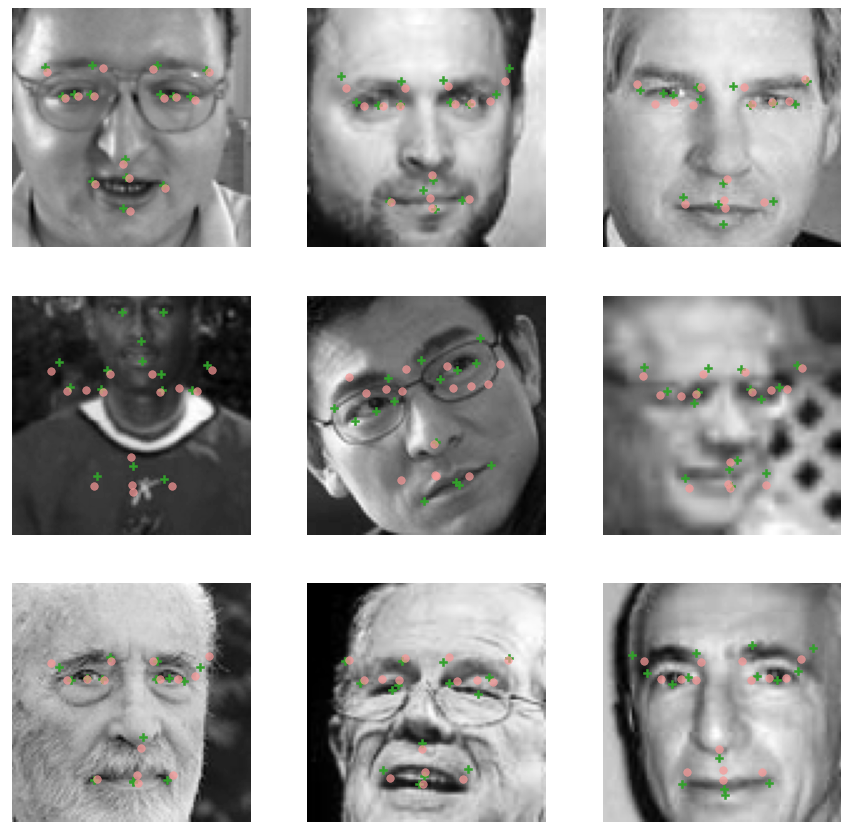

In [0]:
# generate 9 random indicies to visualize
idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], knn_predictions[idx], kp_train = Y_dev_ffill[idx])

# 3. Evaluate model performance

### 3.1 LeNet5 + ffill

9/9 [==============================] - 0s 3ms/step - loss: 20.0107 - mean_absolute_error: 3.2854


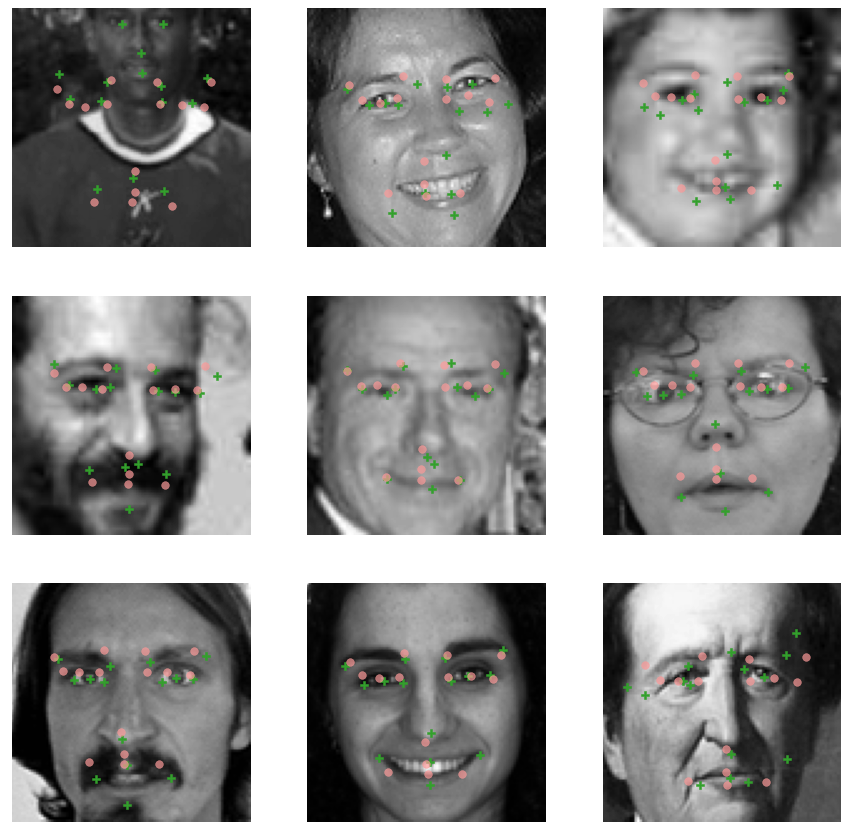

In [0]:
# evaluate the model
LeNet5_ffill.evaluate(X_dev, Y_dev_ffill)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = LeNet5_ffill.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_ffill[idx])

### 3.2 LeNet5 + median

9/9 [==============================] - 0s 3ms/step - loss: 13.6141 - mean_absolute_error: 2.5186


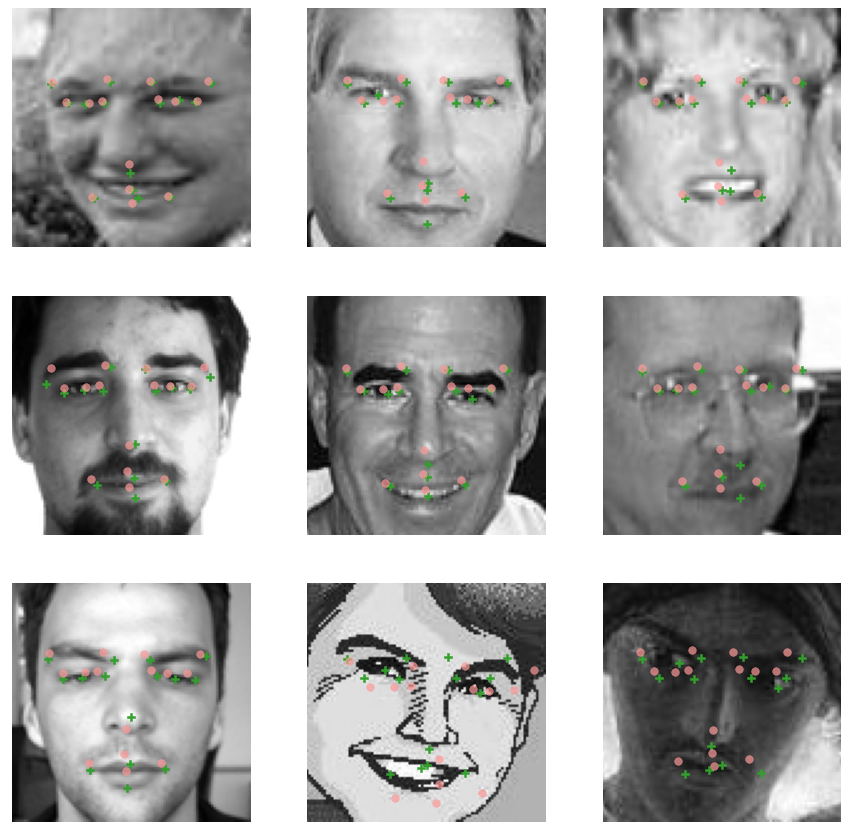

In [0]:
# evaluate the model
LeNet5_median.evaluate(X_dev, Y_dev_median)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = LeNet5_median.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_median[idx])

### 3.3 LeNet5 + knn

9/9 [==============================] - 0s 3ms/step - loss: 19.9527 - mean_absolute_error: 2.8304


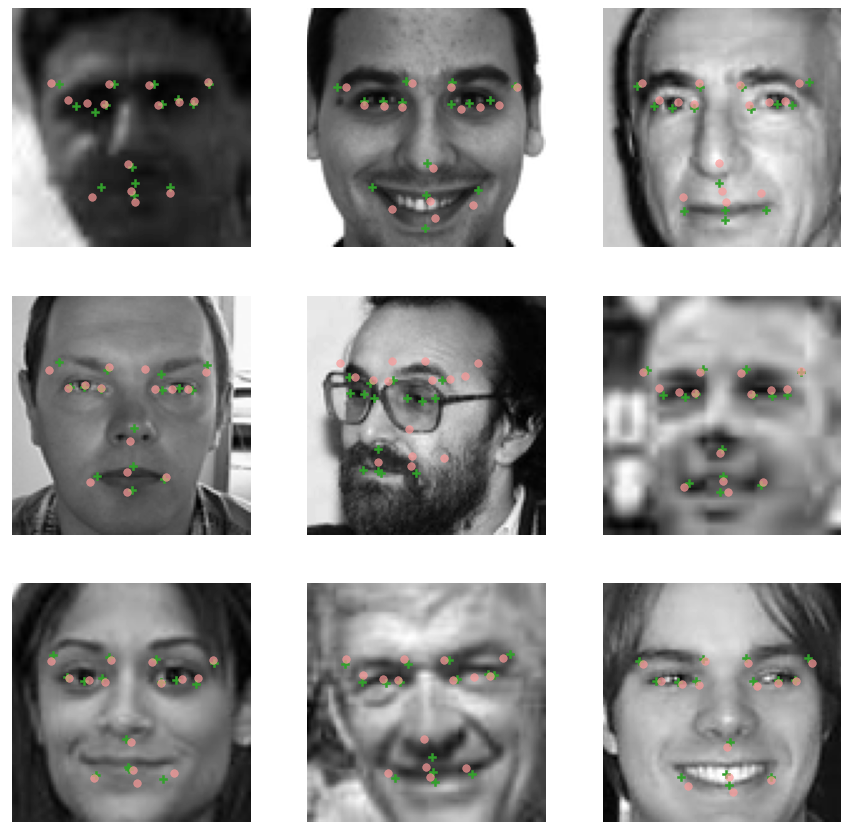

In [0]:
# evaluate the model
LeNet5_knn.evaluate(X_dev, Y_dev_knn)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = LeNet5_knn.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_knn[idx])

### 3.4 VGG16

9/9 [==============================] - 0s 35ms/step - loss: 13.1678 - mean_absolute_error: 2.2601


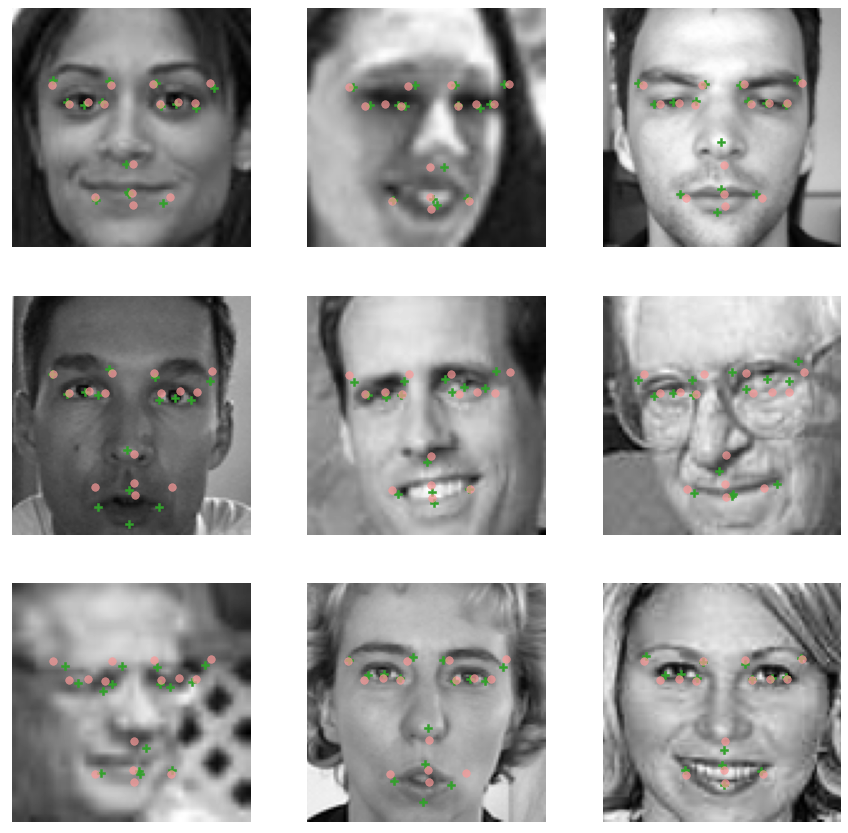

In [0]:
# evaluate the model
VGG16.evaluate(X_dev, Y_dev_knn)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = VGG16.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_knn[idx])

### 3.5 VGG16 + ImageNet

9/9 [==============================] - 0s 18ms/step - loss: 4.3747 - mean_absolute_error: 1.3232


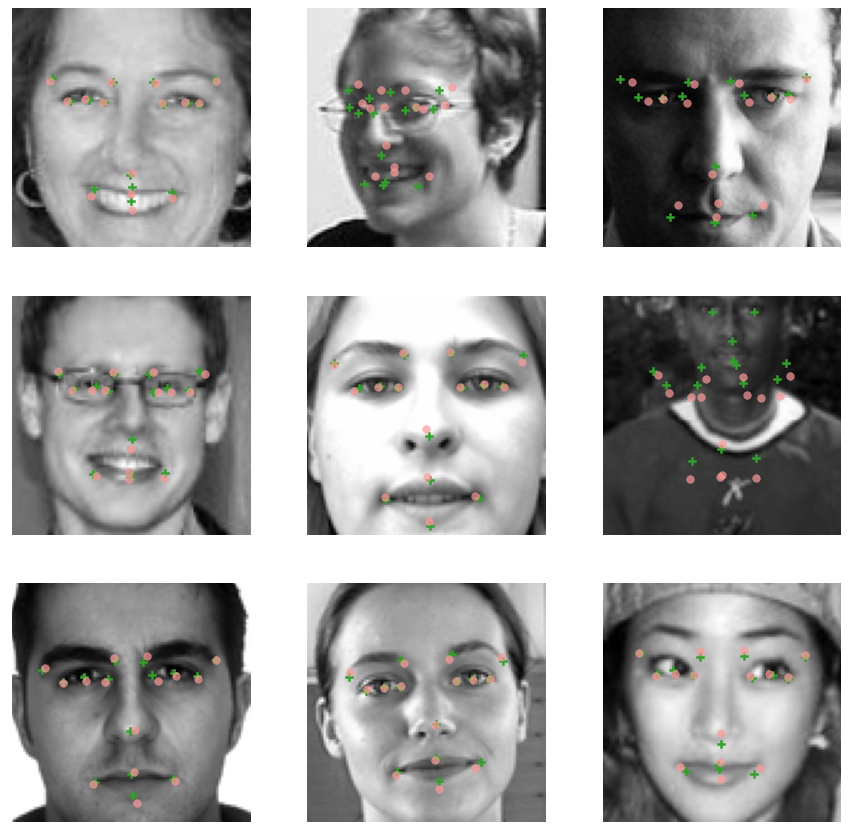

In [0]:
# evaluate the model
VGG16_imagenet.evaluate(X_dev, Y_dev_knn)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = VGG16_imagenet.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_knn[idx])

### 3.6 VGG16 + ImageNet + Data Augmentation


9/9 [==============================] - 0s 17ms/step - loss: 3.9730 - mean_absolute_error: 1.3321


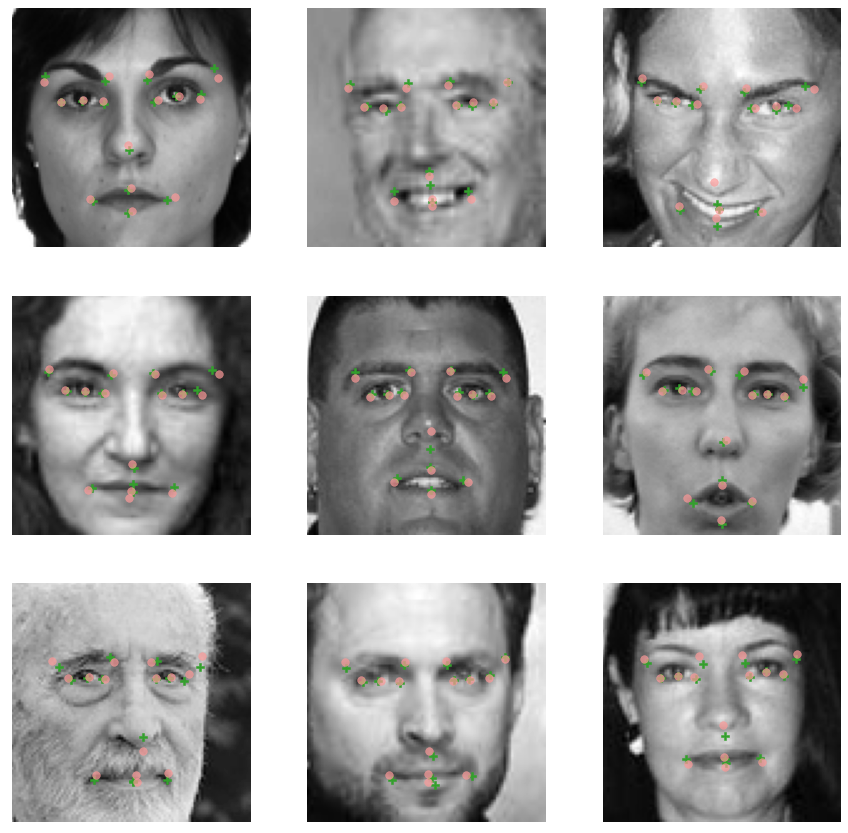

In [0]:
# evaluate the model
VGG16_dataaug.evaluate(X_dev, Y_dev_knn)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = VGG16_dataaug.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_knn[idx])

### 3.7 VGG19

9/9 [==============================] - 0s 19ms/step - loss: 13.1756 - mean_absolute_error: 2.2772


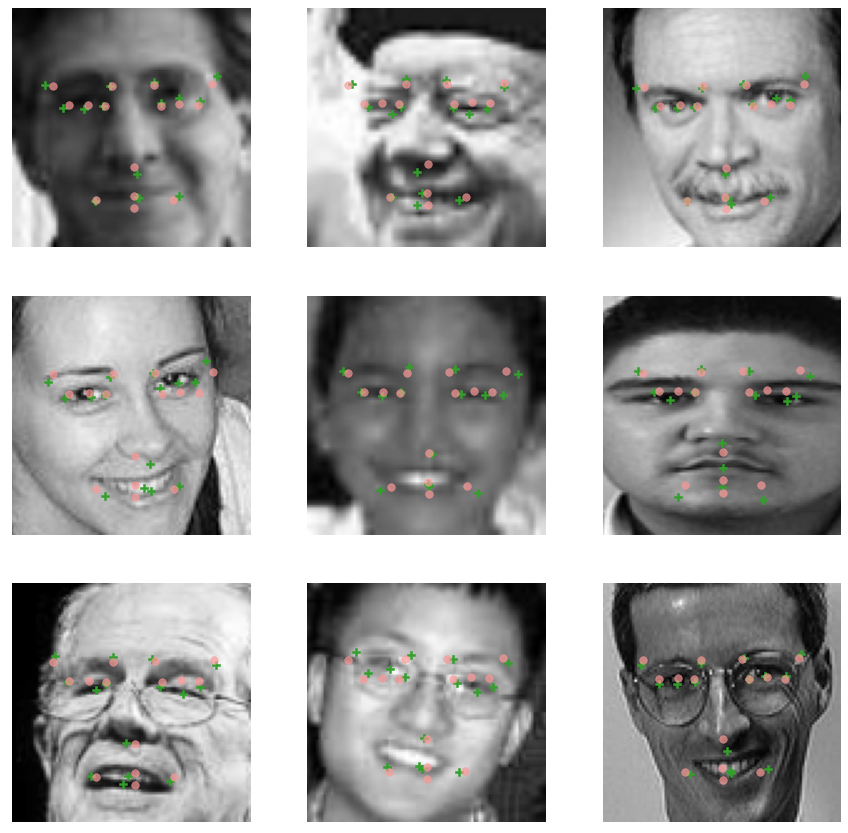

In [0]:
# evaluate the model
VGG19.evaluate(X_dev, Y_dev_knn)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = VGG19.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_knn[idx])

### 3.8 VGG19 + ImageNet

9/9 [==============================] - 0s 19ms/step - loss: 4.2878 - mean_absolute_error: 1.3434


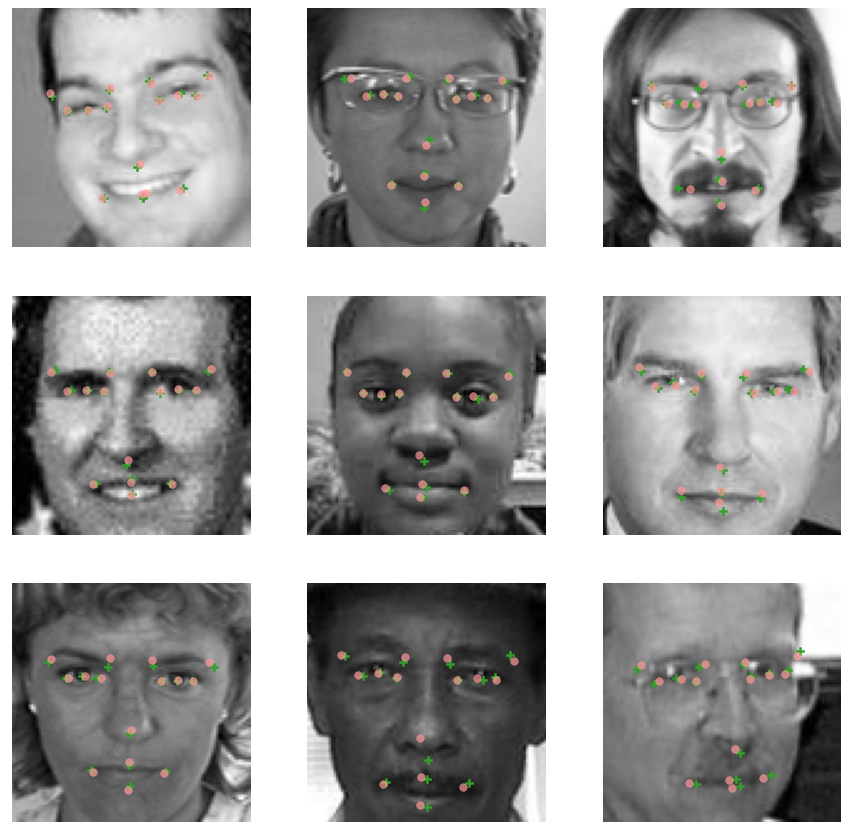

In [0]:
# evaluate the model
VGG19_imagenet.evaluate(X_dev, Y_dev_knn)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = VGG19_imagenet.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_knn[idx])

### 3.9 VGG19 + ImageNet + Data Augmentation

9/9 [==============================] - 0s 20ms/step - loss: 4.3074 - mean_absolute_error: 1.3529


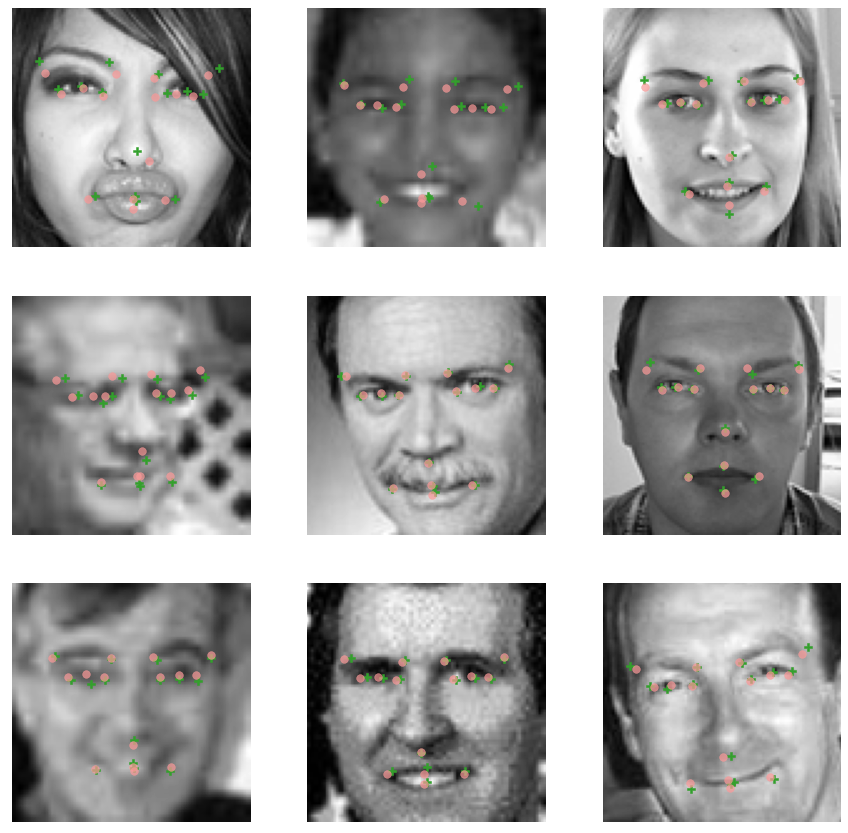

In [0]:
# evaluate the model
VGG19_dataaug.evaluate(X_dev, Y_dev_knn)

# make predictions using dev images and visualize the predictions
Y_dev_predicted = VGG19_dataaug.predict(X_dev)

idx = np.random.choice(X_dev.shape[0], size = 9, replace = False).tolist()
plot_images(X_dev[idx], Y_dev_predicted[idx], kp_train = Y_dev_knn[idx])

# 4. Error analysis

In [0]:
# load the entire dev set, not excluding the ones used for training validation
X_dev = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_img.pkl", "rb" ) )
Y_dev_original = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_original.pkl", "rb" ) )

Y_dev_ffill = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_ffill.pkl", "rb" ) )
Y_dev_median = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_median.pkl", "rb" ) )
Y_dev_knn = pickle.load( open( "/content/drive/My Drive/facial_recognition/resources/dev_kp_knn.pkl", "rb" ) )

# there are two dev data points where the labeled coordinates from the original dataset were wildly off 
# (girl with glasses, close up of man with stubbles)
# thse data points are giving large MSE for the predicted Y values even though the model is fairly close to the actual kp
# so remove them from the dev data set to view the images with actually high error
X_dev = np.delete(X_dev, 201, axis = 0)
Y_dev_original = np.delete(Y_dev_original, 201, axis = 0)
Y_dev_ffill = np.delete(Y_dev_ffill, 201, axis = 0)
Y_dev_median = np.delete(Y_dev_median, 201, axis = 0)
Y_dev_knn = np.delete(Y_dev_knn, 201, axis = 0)

X_dev = np.delete(X_dev, 380, axis = 0)
Y_dev_original = np.delete(Y_dev_original, 380, axis = 0)
Y_dev_ffill = np.delete(Y_dev_ffill, 380, axis = 0)
Y_dev_median = np.delete(Y_dev_median, 380, axis = 0)
Y_dev_knn = np.delete(Y_dev_knn, 380, axis = 0)

def find_worst_examples(model):
  # helper function to find the images with the largest loss (MSE)
  # input is a model
  # output is the top 9 images with the largest losses, their X data, their y and predicted y_value
  predictions = model.predict(X_dev)

  # the subtraction will create nans if the original values were missing
  diff = predictions - Y_dev_original
  sq_error = diff**2

  # calculate the mean ignoring nan
  mse = np.nanmean(sq_error, axis = 1)

  # get the top 9 in descending order (first image has the largest error)
  top_9_idx = mse.argsort()[-9:][::-1]

  worst_predictions = predictions[top_9_idx]

  return worst_predictions, top_9_idx

### 4.1 LeNet5 + ffill

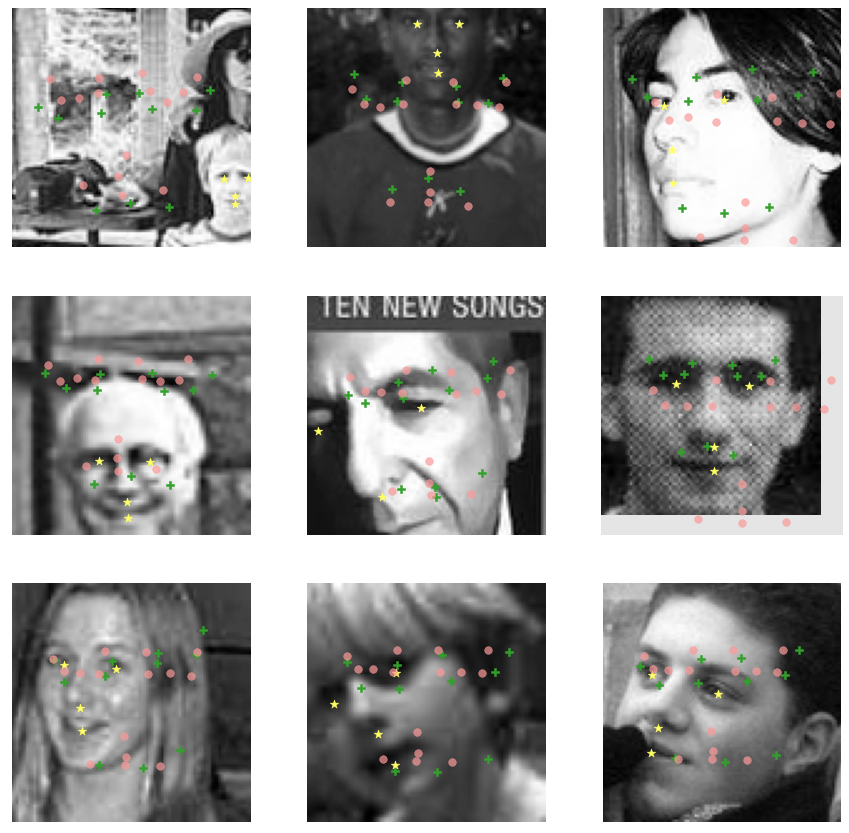

In [0]:
worst_predictions, top_9_idx = find_worst_examples(LeNet5_ffill)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_ffill[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.2 LeNet5 + median

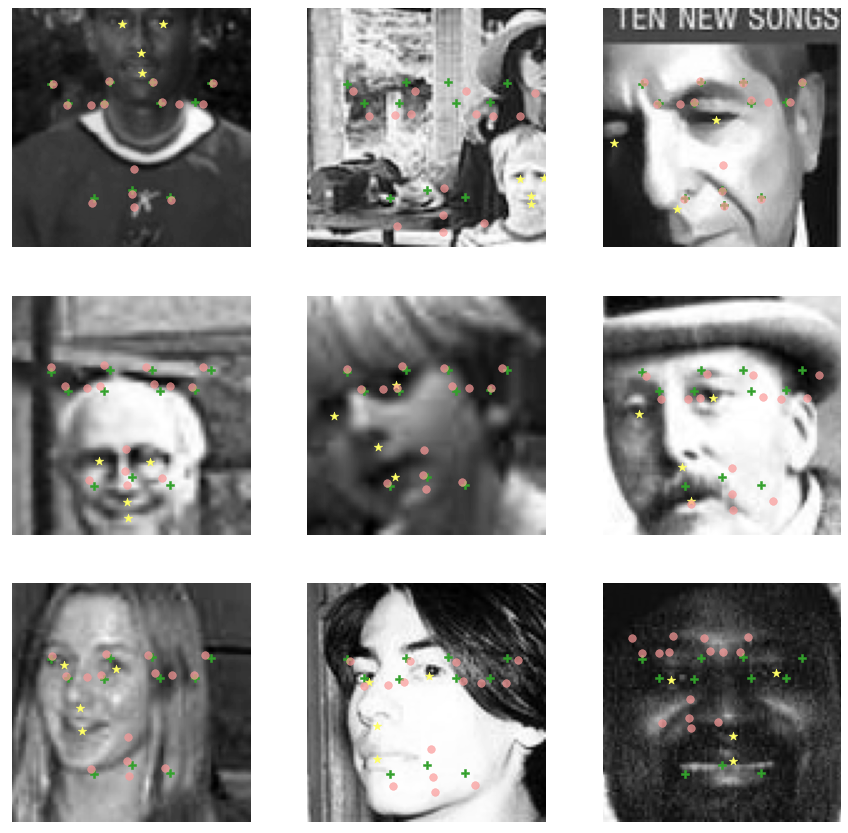

In [0]:
worst_predictions, top_9_idx = find_worst_examples(LeNet5_median)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_median[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.3 LeNet5 + knn

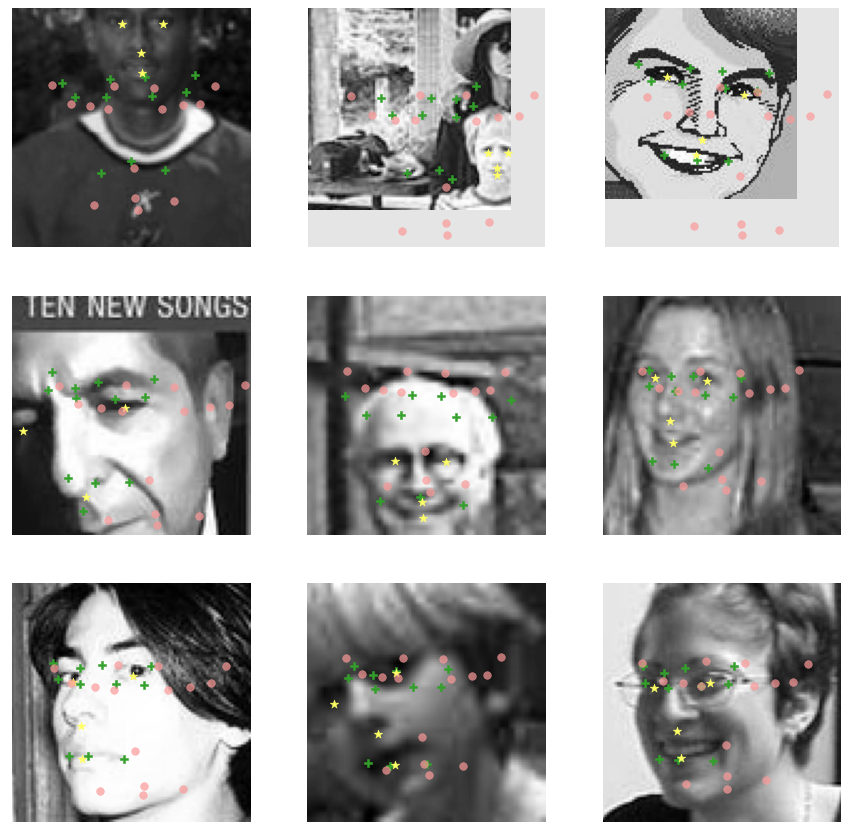

In [0]:
worst_predictions, top_9_idx = find_worst_examples(LeNet5_knn)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_knn[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.4 VGG16

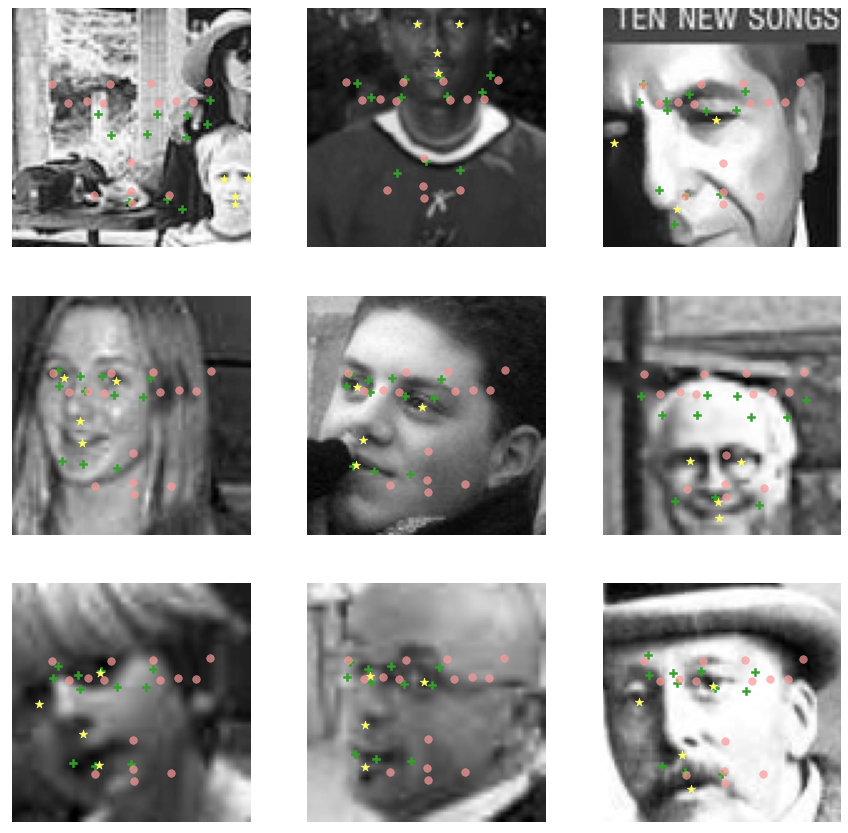

In [0]:
worst_predictions, top_9_idx = find_worst_examples(VGG16)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_knn[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.5 VGG16 + ImageNet

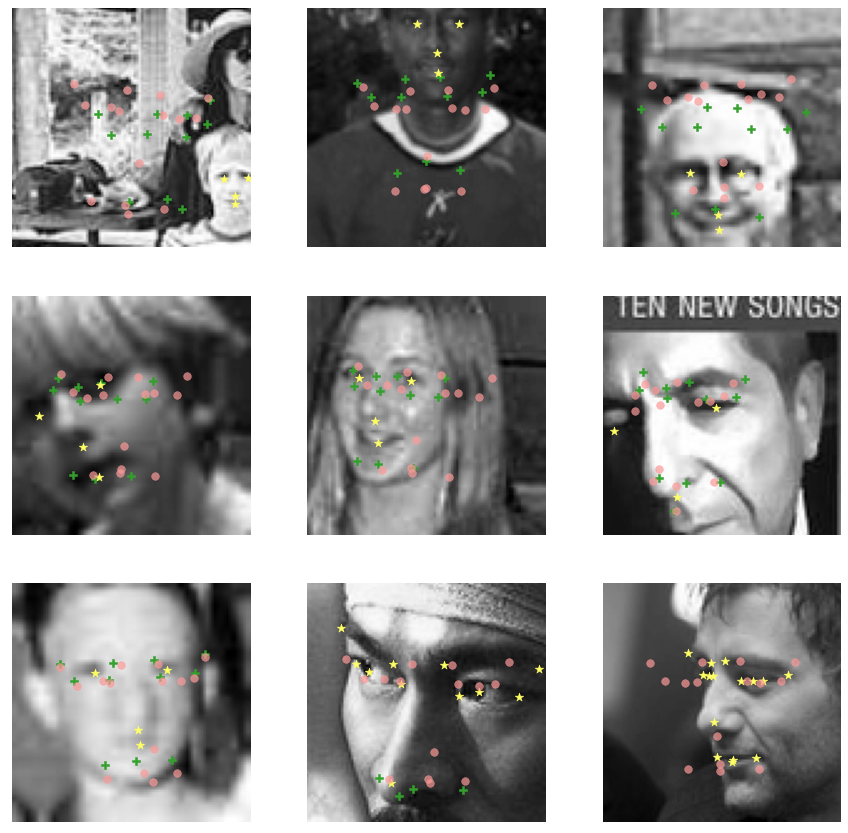

In [0]:
worst_predictions, top_9_idx = find_worst_examples(VGG16_imagenet)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_knn[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.6 VGG16 + ImageNet + Data Augmentation

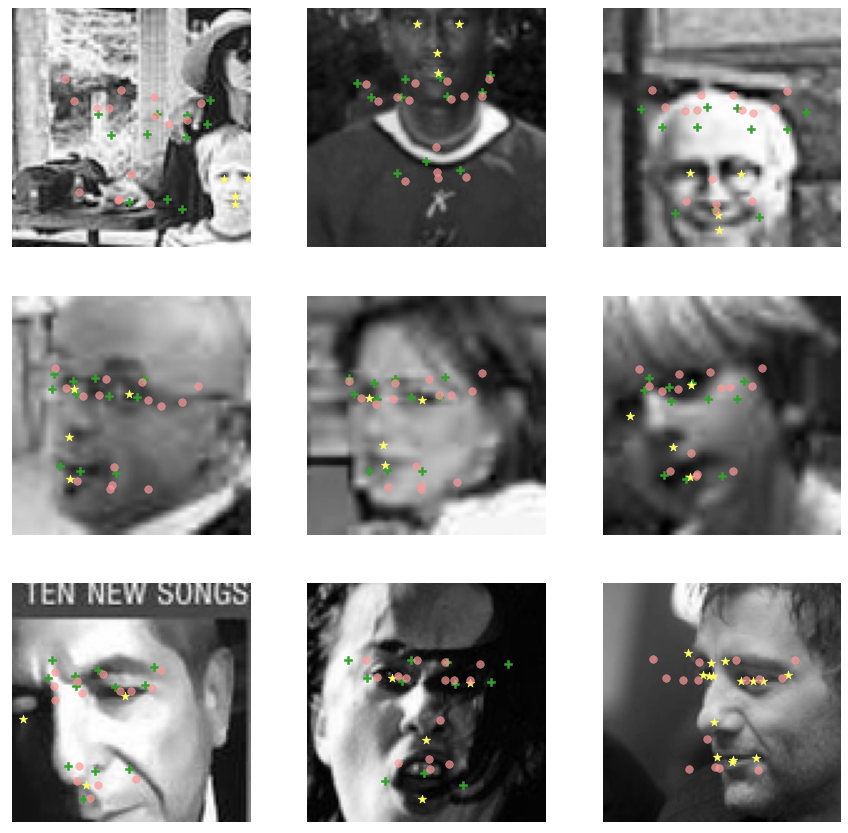

In [0]:
worst_predictions, top_9_idx = find_worst_examples(VGG16_dataaug)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_knn[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.7 VGG19

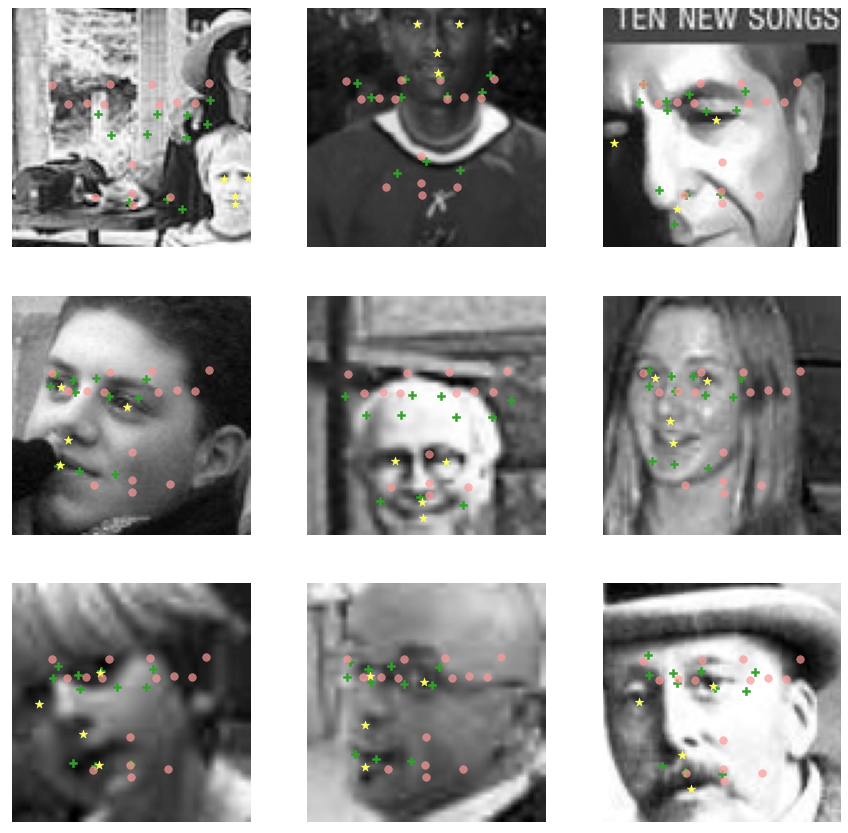

In [0]:
worst_predictions, top_9_idx = find_worst_examples(VGG19)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_knn[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.8 VGG19 + ImageNet

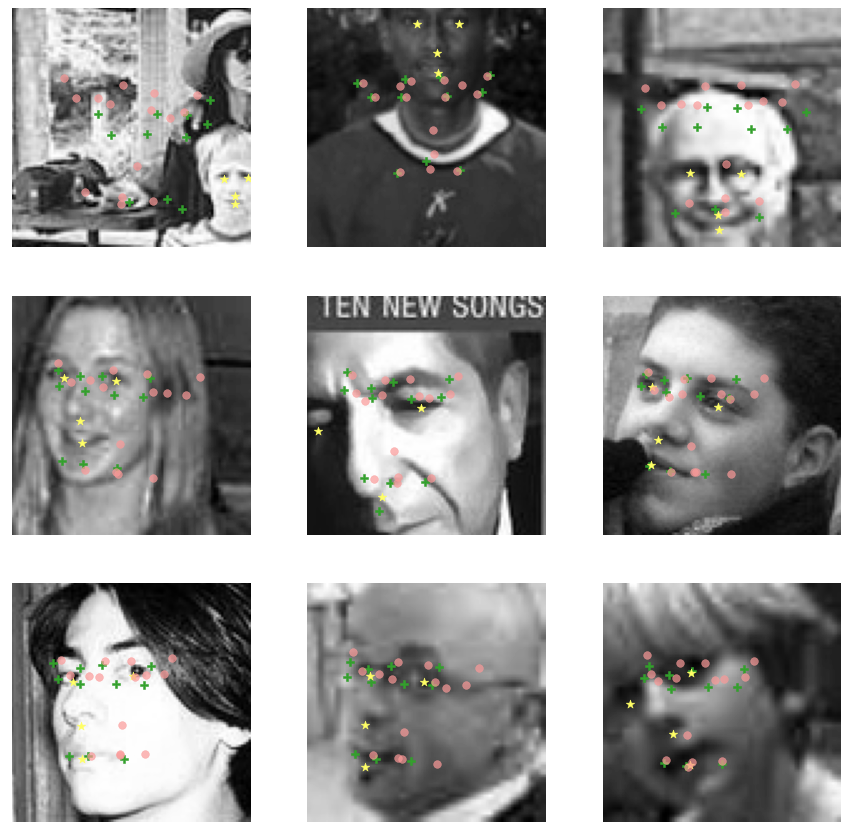

In [0]:
worst_predictions, top_9_idx = find_worst_examples(VGG19_imagenet)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_knn[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

### 4.9 VGG19 + ImageNet + Data Augmentation

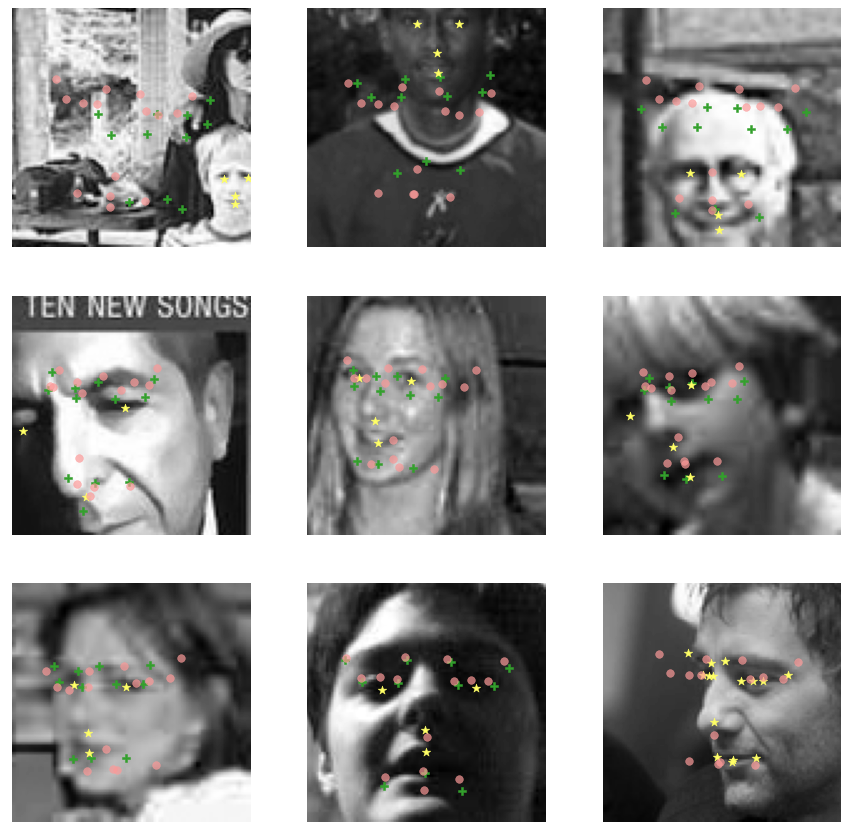

In [0]:
worst_predictions, top_9_idx = find_worst_examples(VGG19_dataaug)

plot_images(X_dev[top_9_idx], 
            worst_predictions, 
            kp_train = Y_dev_knn[top_9_idx], 
            kp_original = Y_dev_original[top_9_idx])

# 5. Use best model on test set

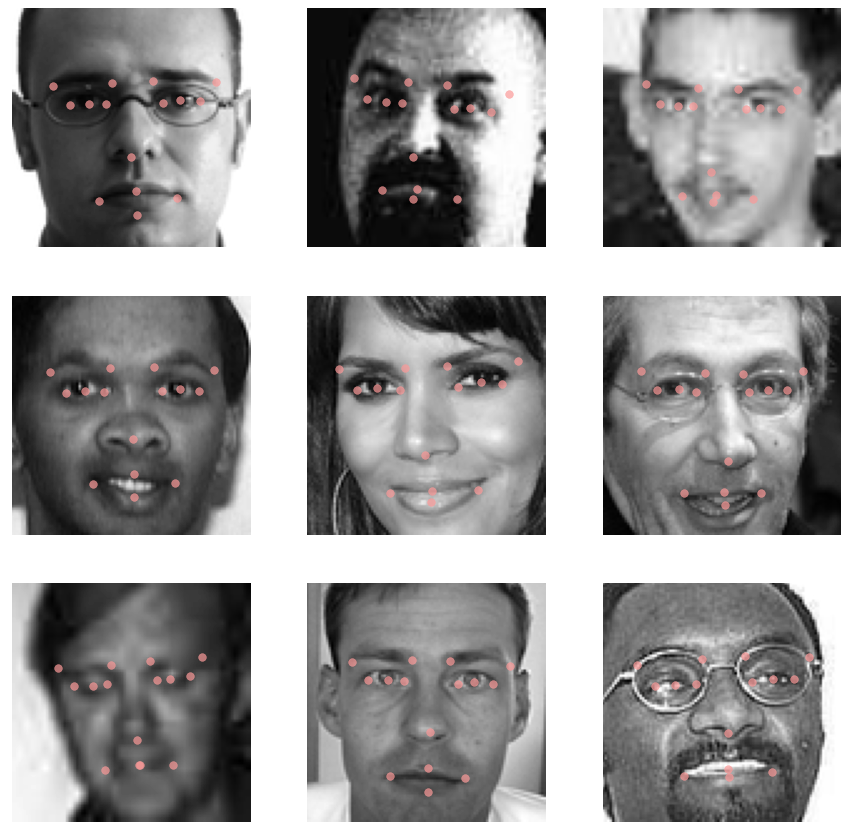

In [0]:
Y_test_predicted = VGG16_dataaug.predict(X_test)

idx = np.random.choice(X_test.shape[0], size = 9, replace = False).tolist()
plot_images(X_test[idx], Y_test_predicted[idx])

# 6. Out of the box face detection

In [0]:
from google.colab import files
import cv2

def face_key_points_detection(filename):
    # load cv2's face detecting cascade classifier
    facedata = "/content/drive/My Drive/facial_recognition/cascade/haarcascade_frontalface_alt.xml"
    face_cascade = cv2.CascadeClassifier(facedata)

    # use cv2 to read the uploaded image and convert to gray scale
    img = cv2.imread(filename)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # use the classifier to detect a face
    faces = face_cascade.detectMultiScale(gray)

    # list_of_arrays is used tack on the cropped out numpy arrays
    list_of_arrays = []

    # if there are faces detected, iterate through each face
    if len(faces) > 0:
        for idx, face in enumerate(faces):

            # get the coordinate info for the face, crop out the appropriate 
            # portion of the numpy array, then use cv2 to resize to 96
            x, y, w, h = face
            cropped_array = gray[y:y+h, x: x+w]
            ninesix = cv2.resize(cropped_array, dsize=(96, 96))
            list_of_arrays.append( ninesix.reshape(1, 96, 96, 1) )
        
        # after iterating through all faces, go the arrays stored in list_of_arrays,
        # concatenate them vertically so it's the shape expected for input
        x_data = np.concatenate(list_of_arrays, axis = 0)

    # if no face detected, take a best guess by cropping out a square in the center
    else:
        h, w = gray.shape
        offset = round(abs((h - w)/2))
        
        if h == w:
            cropped_array = gray
        elif h > w: # if height greater than width, trim each side of height
            cropped_array = gray[offset:offset+w, :]
        else: # if width greater height, trim each side of width
            cropped_array = gray[:, offset:offset+h]
            
        ninesix = cv2.resize(cropped_array, dsize=(96, 96))
        x_data = ninesix.reshape(1, 96, 96, 1)

    # make a prediction using the best model
    y_predicted = VGG16_dataaug.predict(x_data)

    # calculate how many rows to plot for the plot, set up plt
    num_of_img = x_data.shape[0]
    num_of_row = int(np.ceil(num_of_img/3))

    # need to take special consideration for when there's only one row or one column
    # because subplot axis are called differently in those cases
    if num_of_row == 1:
        num_of_col = int(np.mod(num_of_img, 3))
        fig, ax = plt.subplots(num_of_row, num_of_col, figsize=(5*num_of_col, 5*num_of_row))
    else:
        fig, ax = plt.subplots(num_of_row, 3, figsize=(15, 5*num_of_row))
    plt.setp(ax, xticks=(), yticks=())  

    # plot each image
    for row in range(num_of_img):   
        image = x_data[row,:].reshape(96, 96)

        i = int(np.floor(row/3))
        j = int(np.mod(row,3))

        curr_kp = y_predicted[row,:]    
        curr_kp_zipped = list(zip(curr_kp[::2], curr_kp[1::2]))

        if num_of_row == 1:
            if num_of_col == 1:
                ax.imshow(image, cmap="gray")
                for p in curr_kp_zipped:
                    ax.scatter(p[0], p[1], s=60, c='#fb9a99', marker='o', alpha = 0.7)
            else:
                ax[j].imshow(image, cmap="gray")
                for p in curr_kp_zipped:
                    ax[j].scatter(p[0], p[1], s=60, c='#fb9a99', marker='o', alpha = 0.7)
        else:
            ax[i, j].imshow(image, cmap="gray")
            for p in curr_kp_zipped:
                ax[i,j].scatter(p[0], p[1], s=60, c='#fb9a99', marker='o', alpha = 0.7)

    plt.show()

Saving law and order.jpg to law and order.jpg


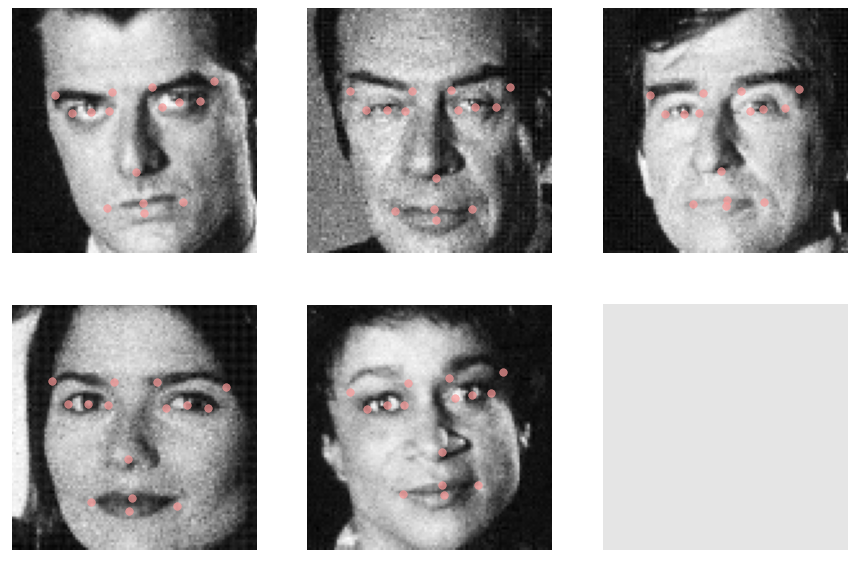

In [0]:
# prompt a file load, the code works with uploading one image only
uploaded = files.upload()

for key in uploaded.keys():
    filename = key

face_key_points_detection(filename)


# 7. Visualize convolution within models

### 7.1 LeNet5

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 94, 94, 6)         60        
_________________________________________________________________
average_pooling2d_4 (Average (None, 47, 47, 6)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 45, 45, 16)        880       
_________________________________________________________________
average_pooling2d_5 (Average (None, 22, 22, 16)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 7744)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 120)               929400    
_________________________________________________________________
dropout_2 (Dropout)          (None, 120)              

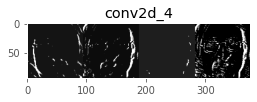

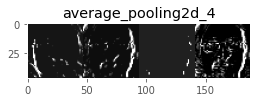

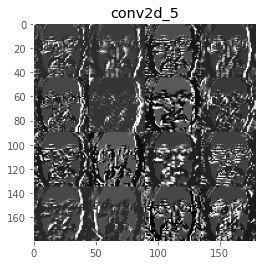

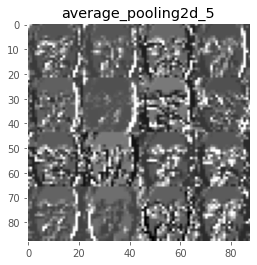

In [0]:
# Code Modified from: https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0

# Model to feed in
model = LeNet5_knn

# Index of the sample image 
imgnum=3

# Print out all the layers, their names, and shapes 
print(model.summary())

# These are the layer outputs 
layer_outputs = [layer.output for layer in model.layers]

activation_model = keras.models.Model(inputs=model.input, outputs=layer_outputs)

# This is where you predict an input. I'm gonna try predicting just one image later, instead of the whole dev set, since VGG 16 is running out of memory 
activations = activation_model.predict(X_dev) 
# Each element in activations is a separate layer. Refer to summary for what these look like. 
# You could also do something like: activation[0].shape for the shape of the first layer 
# The shape will be in this form:   number of examples X size of feature map x size of feature map x number of channels

layer_names = []
for layer in model.layers:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 4    

for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    ## Only if shape has 4 numbers. So ignore flattened/fully connected layers
    if len(layer_activation.shape) == 4:
      
      n_features = layer_activation.shape[-1] # Number of features in the feature map
      size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).

      
      n_cols =  n_features // images_per_row # Tiles the activation channels in this matrix
      display_grid = np.zeros((size * n_cols, images_per_row * size))

      for col in range(n_cols): # Tiles each filter into a big horizontal grid
          for row in range(images_per_row):
              channel_image = layer_activation[imgnum,   # image number
                                                :, :,
                                                col * images_per_row + row]
              # Post-processes the feature to make it visually palatable
              channel_image -= channel_image.mean() 
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size, # Displays the grid
                            row * size : (row + 1) * size] = channel_image
      scale = 1. / size
      plt.figure(figsize=(scale * max(display_grid.shape[1], 1),
                          scale * max(display_grid.shape[0], 1)))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap="gray")

### 7.2 VGG16
The standard VGG16 in keras expects triple channel RGB input. Our trained model only has 1 channel (grayscale). The following code trains a new triple channel VGG16 model for the purpose of visualizing the layers.

In [0]:
def create_vgg16_model_triple_channel(input_shape):
  #load VGG16 model pre-trained with imagenet
  pre_trained_model = keras.applications.VGG16(weights="imagenet", include_top=False, input_shape=input_shape)
  
  #freeze convolutional layers
  for layer in pre_trained_model.layers:
    layer.trainable = False

  # Flatten the output layer to 1 dimension
  x = keras.layers.Flatten()(pre_trained_model.output)
  # Add a fully connected layer with 1,024 hidden units and ReLU activation
  x = keras.layers.Dense(1024, activation='relu')(x)
  # Add a dropout rate of 0.2
  x = keras.layers.Dropout(0.2)(x)                  
  x = keras.layers.Dense  (30)(x) 
  model = keras.Model(pre_trained_model.input, x)
  return model

X_batch_3channel = np.repeat(X_train, 3, axis=-1)
VGG16_transfer_triple_channel = create_vgg16_model_triple_channel((96,96,3))
VGG16_transfer_triple_channel.compile(optimizer='adam', loss='mean_squared_error')
VGG16_transfer_triple_channel.fit(X_batch_3channel, Y_train, epochs = 20, batch_size = 256, validation_split = 0.2, verbose = 0)

VGG16_transfer_triple_channel.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 96, 96, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 96, 96, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 96, 96, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 48, 48, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 48, 48, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 48, 48, 128)       147584    
____________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:45: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


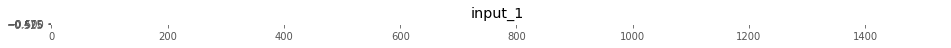

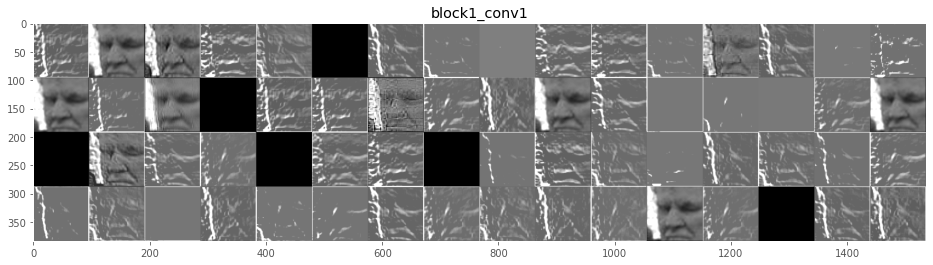

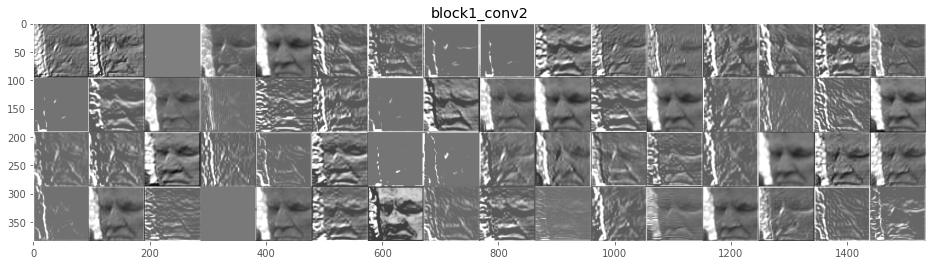

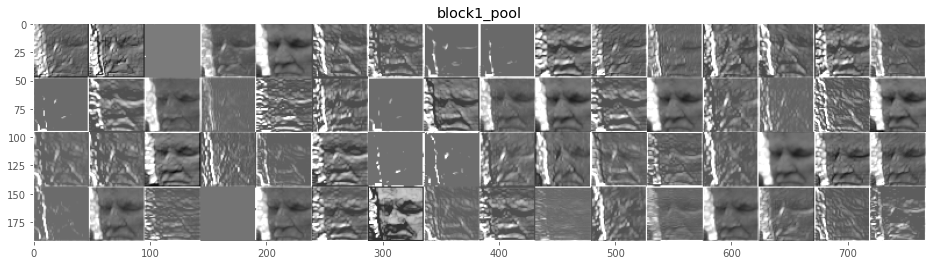

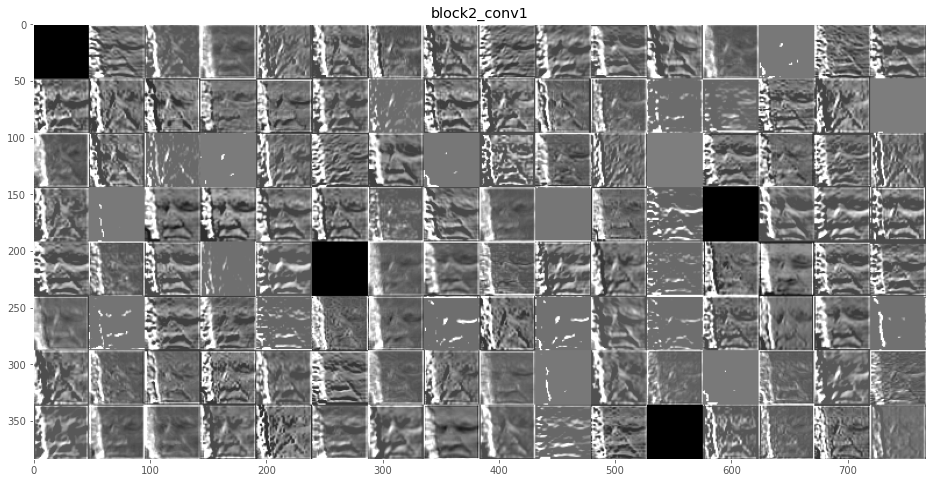

...

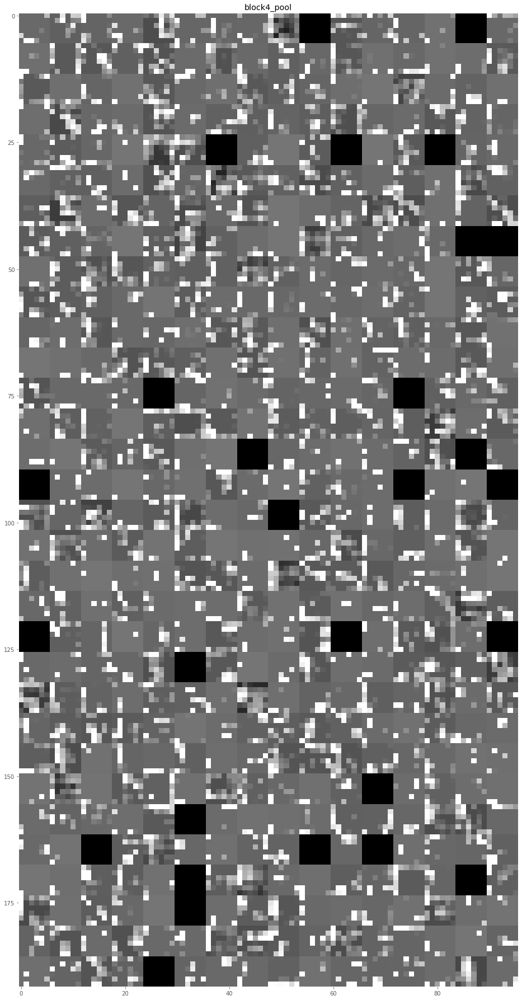

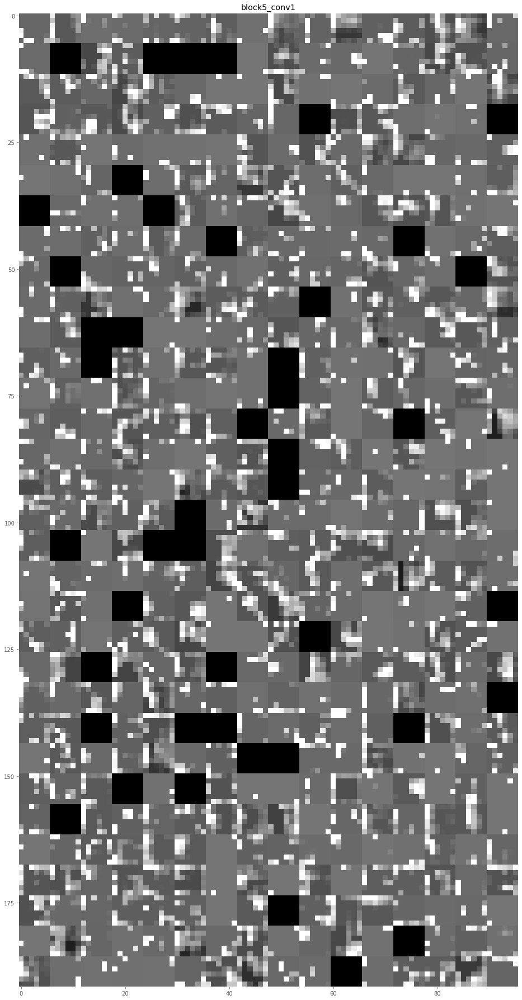

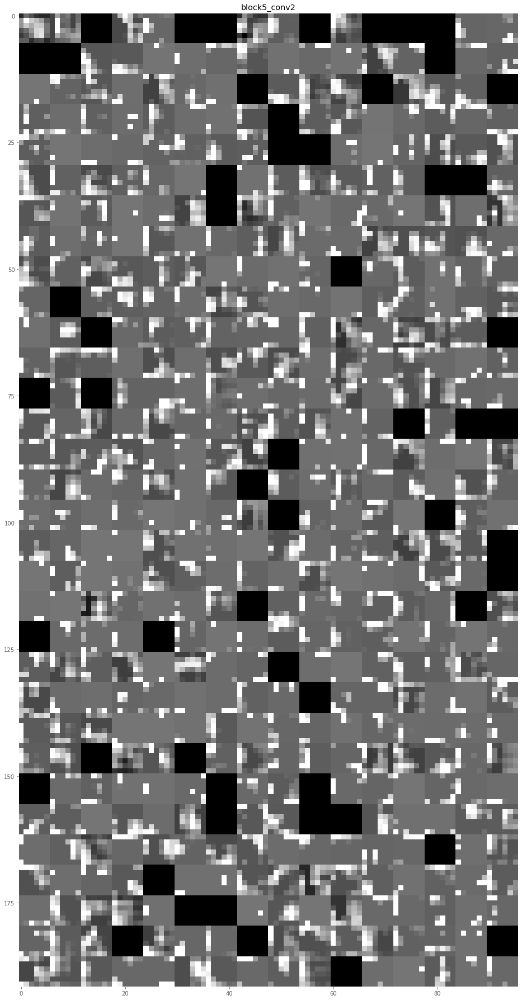

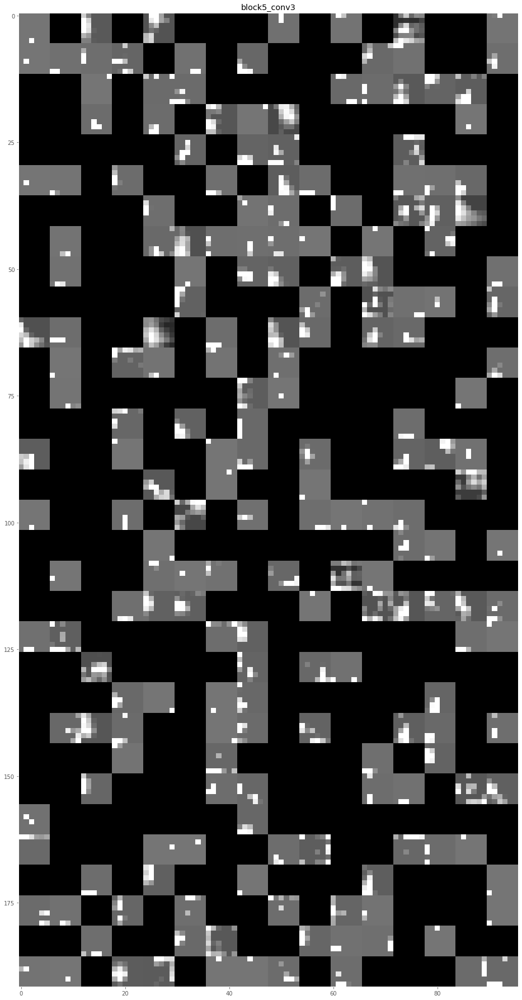

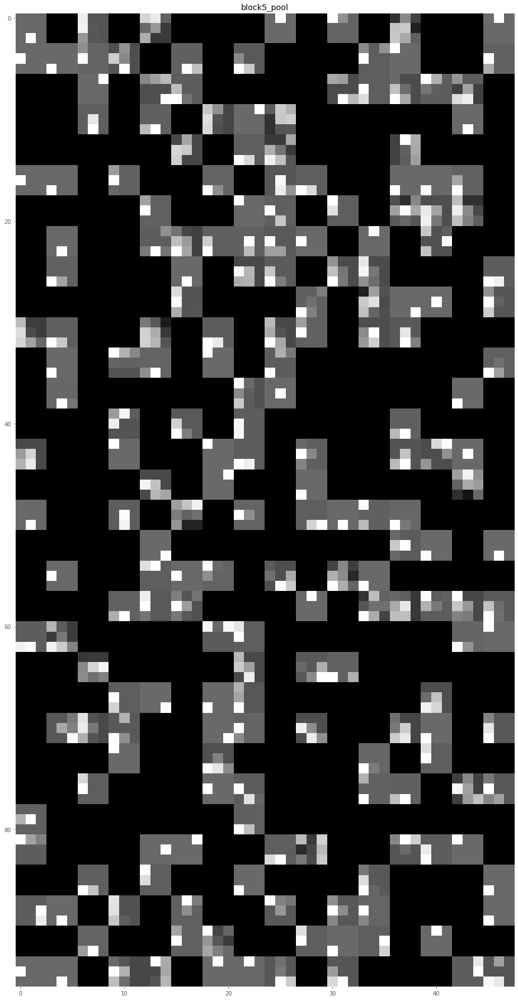

In [0]:
sample_image = X_train[3]
predicted_input = np.expand_dims(np.repeat(sample_image,3,axis=-1),axis=0)

def visualize_activations(model, sample_image, predicted_input):
  #which sample do you want to visualize?

  successive_outputs = [layer.output for layer in model.layers]
  visualization_model = keras.models.Model(inputs = model.input , outputs = successive_outputs)
  activations  = visualization_model.predict(predicted_input)

  #Visualization code
  # layer_names = np.arange(0,1)    
  images_per_row = 16

  imgnum=0
  # These are the names of the layers, so can have them as part of our plot
  layer_names = [layer.name for layer in model.layers]
  for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
      ## Only if shape has 4 numbers. So ignore flattened/fully connected layers
      if len(layer_activation.shape) == 4:
      
        n_features = layer_activation.shape[-1] # Number of features in the feature map
        size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).      
        n_cols =  n_features // images_per_row # Tiles the activation channels in this matrix
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        for col in range(n_cols): # Tiles each filter into a big horizontal grid
            for row in range(images_per_row):
                channel_image = layer_activation[imgnum,   # image number
                                                  :, :,
                                                  col * images_per_row + row]
                # Post-processes the feature to make it visually palatable
                channel_image -= channel_image.mean() 
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, # Displays the grid
                              row * size : (row + 1) * size] = channel_image
        scale = 1. / size
        plt.figure(figsize=(scale * max(display_grid.shape[1], 1),
                            scale * max(display_grid.shape[0], 1)))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap="gray")

visualize_activations(VGG16_transfer_triple_channel, sample_image, predicted_input)